In [1]:
from loaddata import process_text_files_with_distance, run_cellpose_on_directory
import numpy as np
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from tifffile import imread
import pandas as pd
import napari
from scipy.spatial import KDTree

dir = "D:/Ziwei/Github/STdata/Resolve files"




Welcome to CellposeSAM, cellpose v
cellpose version: 	4.0.4 
platform:       	win32 
python version: 	3.8.19 
torch version:  	2.3.1+cu121! The neural network component of
CPSAM is much larger than in previous versions and CPU excution is slow. 
We encourage users to use GPU/MPS if available. 




In [2]:
data = process_text_files_with_distance(dir)

 90%|█████████ | 9/10 [01:56<00:11, 11.37s/it]

100%|██████████| 10/10 [01:57<00:00, 11.70s/it]


In [3]:
data.to_csv("D:/Ziwei/Github/STdata/STdata_dis.csv", index=False)

In [2]:
data = pd.read_csv("D:/Ziwei/Github/STdata/STdata_dis.csv",dtype={'Time': str})

In [3]:
run_cellpose_on_directory(dir)


  0%|          | 0/9 [00:00<?, ?it/s]

Processing: D:/Ziwei/Github/STdata/Resolve files\12\MC1_27032024_W1A3_R8_DAPI.tiff


 11%|█         | 1/9 [02:42<21:39, 162.49s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\12\MC1_27032024_W1A3_R8_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\13\MC1_27032024_W5A3_R8_DAPI.tiff


 22%|██▏       | 2/9 [05:56<21:06, 180.92s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\13\MC1_27032024_W5A3_R8_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\16\W2A3_DAPI.tiff


 33%|███▎      | 3/9 [08:08<15:52, 158.80s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\16\W2A3_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\18\W0A5_DAPI.tiff


 44%|████▍     | 4/9 [10:25<12:30, 150.04s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\18\W0A5_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\21\W6A3_DAPI.tiff


 56%|█████▌    | 5/9 [13:44<11:11, 167.91s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\21\W6A3_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\22\W1A4_DAPI.tiff


 67%|██████▋   | 6/9 [15:23<07:13, 144.42s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\22\W1A4_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\24\W7A3_DAPI.tiff


 78%|███████▊  | 7/9 [16:58<04:16, 128.20s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\24\W7A3_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\27\W0A4_DAPI.tiff


 89%|████████▉ | 8/9 [18:10<01:50, 110.28s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\27\W0A4_DAPI_mask.tiff
Processing: D:/Ziwei/Github/STdata/Resolve files\8\W7A1_DAPI.tiff


100%|██████████| 9/9 [21:17<00:00, 141.95s/it]

Saved mask to: D:/Ziwei/Github/STdata/Resolve files\8\W7A1_DAPI_mask.tiff


## Check data

In [4]:

img = imread(f"{dir}/22/W1A4_DAPI.tiff")
masks = imread(f"{dir}/22/W1A4_DAPI_mask.tiff")

viewer = napari.Viewer()
viewer.add_image(img, name='DAPI', colormap='gray',contrast_limits=(img.min(), img.max()))
viewer.add_labels(masks, name='Cellpose Mask')
napari.run()

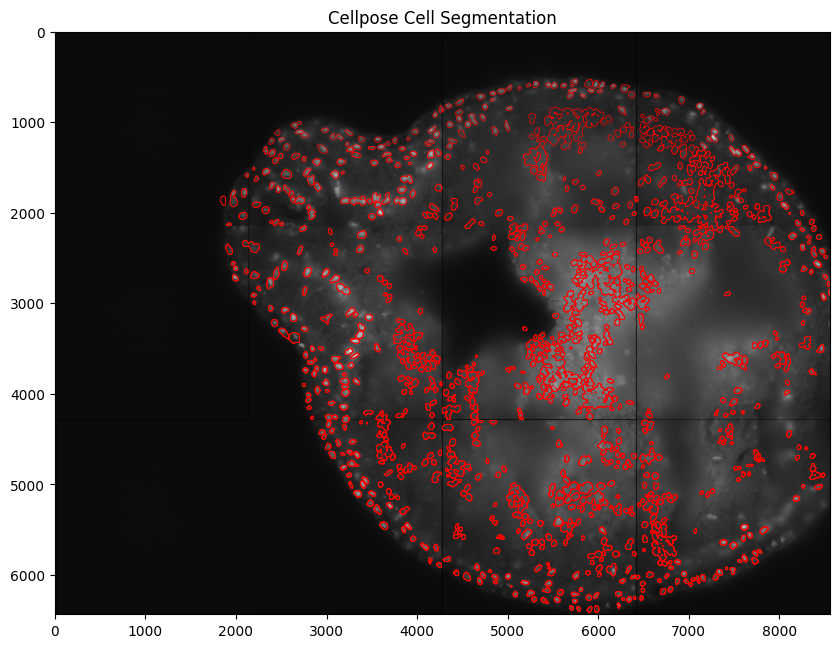

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.contour(masks, colors='red', linewidths=0.5)
plt.title('Cellpose Cell Segmentation')
plt.show()

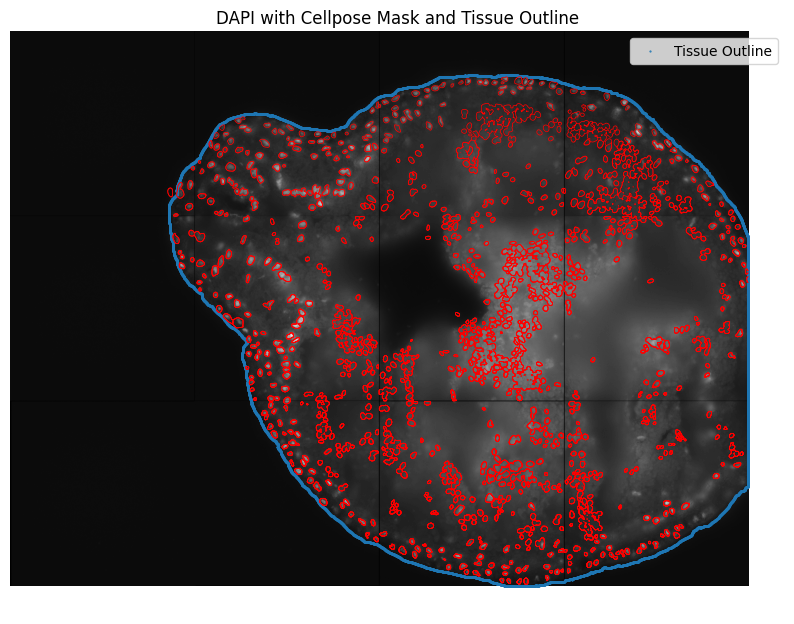

In [6]:
vertices = np.loadtxt(f"{dir}/22/sliceVertices22.dat")
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.contour(masks, colors='red', linewidths=0.5)
plt.scatter(vertices[:, 0], vertices[:, 1],s=0.3, label='Tissue Outline')

plt.title("DAPI with Cellpose Mask and Tissue Outline")
plt.axis('off')
plt.legend()
plt.show()

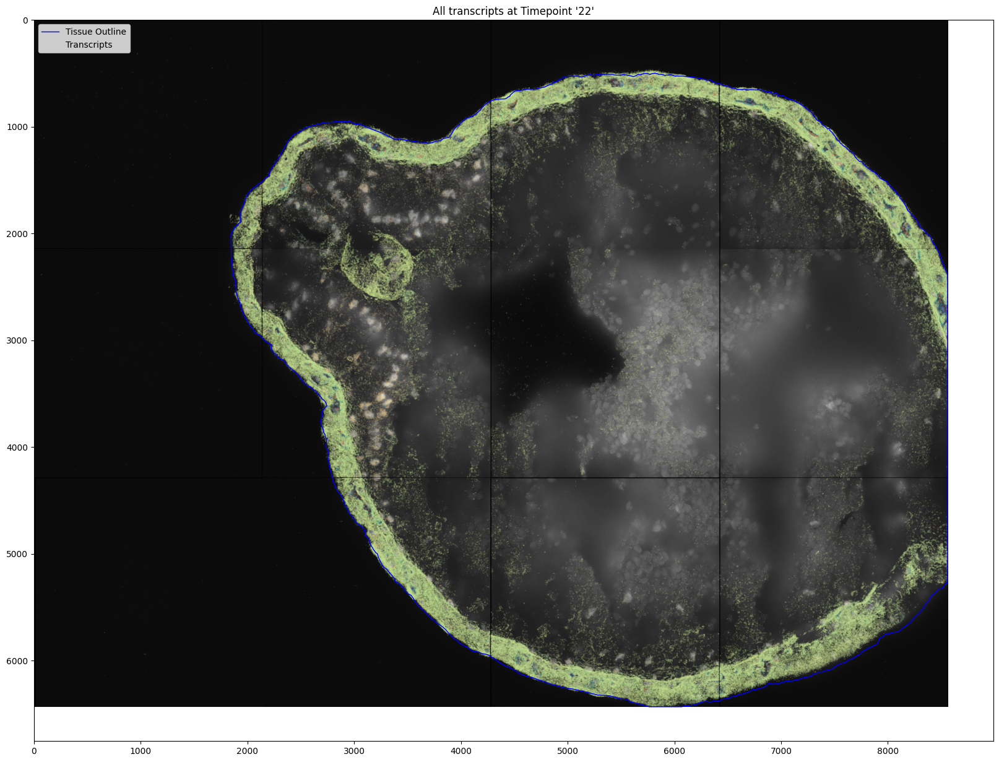

In [ ]:
# --- Load image and tissue outline ---
img = imread(f"{dir}/22/W1A4_DAPI.tiff")
vertices = np.loadtxt(f"{dir}/22/sliceVertices22.dat")

# --- Filter data ---
subset = data[data['Time'] == '22']
coords = subset[['x', 'y']].values

# --- Plot ---
plt.figure(figsize=(20, 20))
plt.imshow(img, cmap='gray')
plt.scatter(vertices[:, 0], vertices[:, 1], s=0.3, label='Tissue Outline')

# Overlay all transcript points
plt.scatter(coords[:, 0], coords[:, 1], s=0.1, c=subset['gene'].astype('category').cat.codes, cmap='Spectral', alpha=0.1, label='Transcripts')

plt.legend(loc='upper left')
plt.title("All transcripts at Timepoint '22'")
plt.show()


In [5]:
subset = data[data['Time'] == '22'].copy()
coords = subset[['x', 'y']].values
coords_napari = coords[:, [1, 0]]
vertices_napari = vertices[:, [1, 0]]

# --- Assign gene names (categorical) ---
gene_names = subset['gene'].astype(str).values
unique_genes = np.unique(gene_names)

# --- Generate a unique color per gene using matplotlib colormap ---
cmap = plt.get_cmap('Spectral', len(unique_genes))  # discrete colors
gene_color_dict = {gene: cmap(i) for i, gene in enumerate(unique_genes)}  # RGBA tuples

# --- Convert RGBA floats to hex colors for napari ---
def rgba_to_hex(rgba):
    return "#{:02x}{:02x}{:02x}".format(
        int(rgba[0]*255), int(rgba[1]*255), int(rgba[2]*255)
    )

gene_color_dict_hex = {gene: rgba_to_hex(color) for gene, color in gene_color_dict.items()}

# --- Prepare properties ---
properties = {'gene': gene_names}

# --- Launch napari ---
viewer = napari.Viewer()

viewer.add_image(img, name='DAPI', colormap='gray',
                 contrast_limits=(img.min(), img.max()))

viewer.add_points(
    coords_napari,
    name='Transcripts',
    size=3,
    properties=properties,
    face_color='gene',
    face_color_cycle=gene_color_dict_hex,
    opacity=1
)

viewer.add_shapes([vertices_napari], shape_type='polygon',
                  edge_color='blue', edge_width=1,
                  face_color='transparent',
                  name='Tissue Outline')

napari.run()

In [8]:
print(subset['gene_code'].min(), subset['gene_code'].max())

0 124


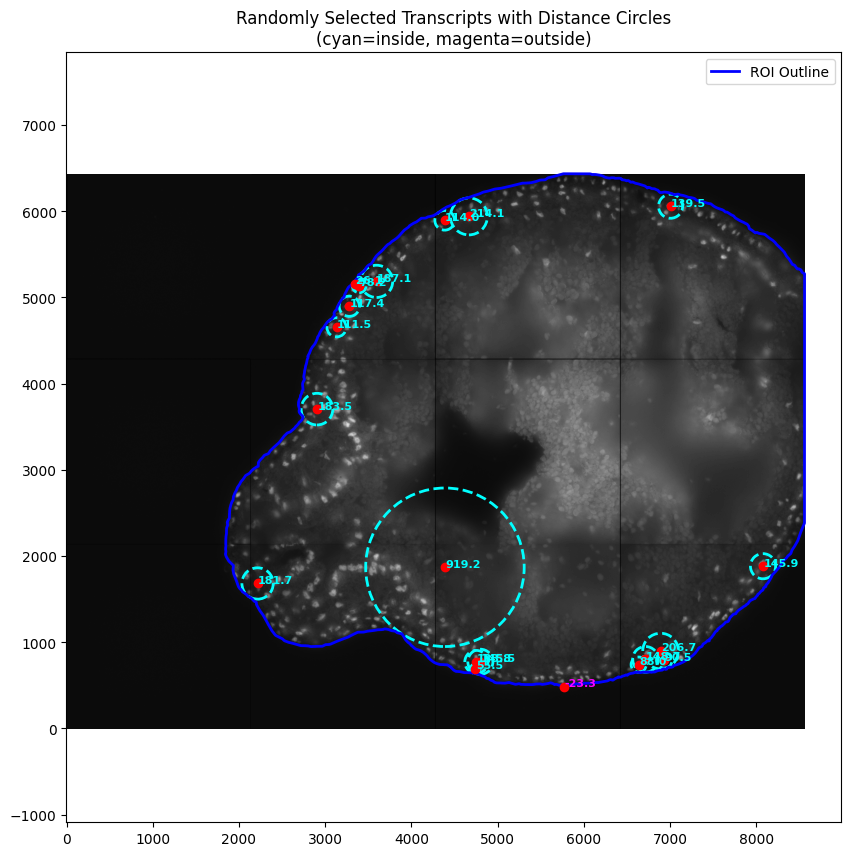

In [ ]:
img = imread(f"{dir}/22/W1A4_DAPI.tiff")
vertices = np.loadtxt(f"{dir}/22/sliceVertices22.dat")

# Select transcripts from time 22
subset = data[data['Time'] == '22']

# Randomly select 10 transcripts
sampled_points = subset.sample(n=20, random_state=42).copy()

# Plot image and outline
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray', origin='lower')

# Plot the outline
plt.scatter(vertices[:, 0], vertices[:, 1], s=0.3, label='ROI Outline')

# Plot sampled transcripts and distance circles
for _, row in sampled_points.iterrows():
    x, y = row['x'], row['y']
    dist = row['Distance_To_Outline']

    # Transcript location
    plt.plot(x, y, 'ro')

    # Distance circle (absolute value, color indicates sign)
    circle_color = 'cyan' if dist > 0 else 'magenta'
    circle = plt.Circle((x, y), abs(dist), color=circle_color, fill=False, linewidth=2, linestyle='--')
    plt.gca().add_patch(circle)

    # Add distance annotation
    plt.text(x + 5, y + 5, f"{dist:.1f}", color=circle_color, fontsize=8, weight='bold')

plt.axis('equal')
plt.title('Randomly Selected Transcripts with Distance Circles\n'
          '(cyan=inside, magenta=outside)')
plt.legend()
plt.show()

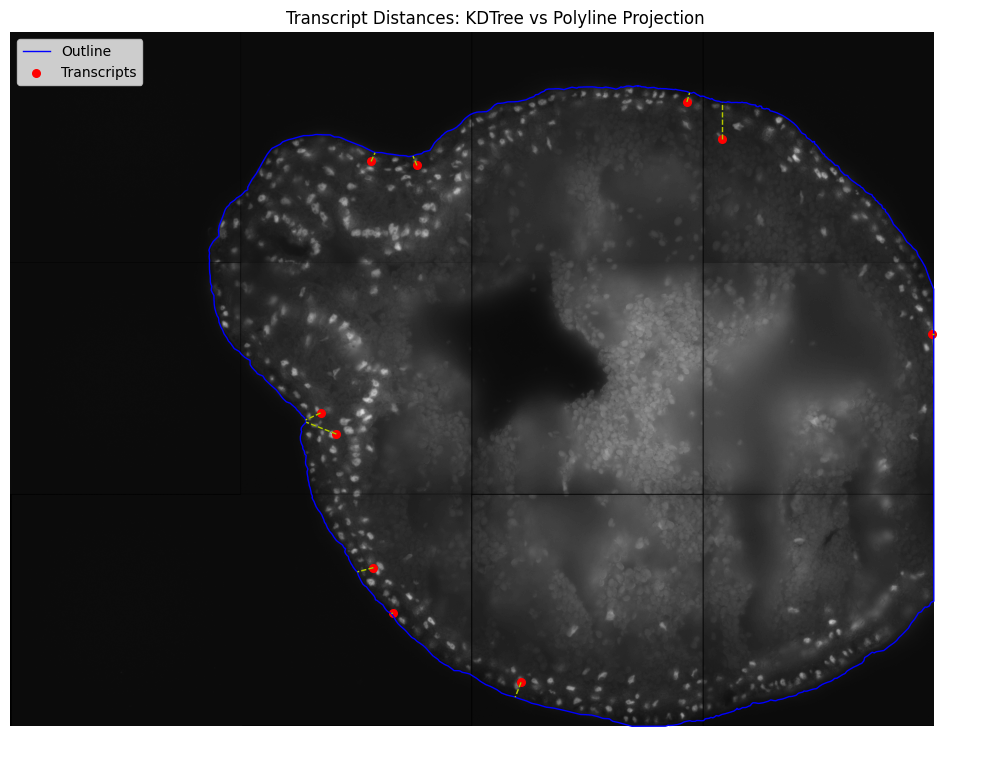

In [ ]:
# --- Load data ---
outline = np.loadtxt(f"{dir}/22/sliceVertices22.dat")
if not np.allclose(outline[0], outline[-1]):
    outline = np.vstack([outline, outline[0]])  # close the loop

transcripts = pd.read_csv("sampled_transcripts_used_for_checking.csv")
coords = transcripts[['x', 'y']].values

# --- Segment-based projection ---
def point_to_segment_distance(px, py, x1, y1, x2, y2):
    dx, dy = x2 - x1, y2 - y1
    if dx == dy == 0:
        return np.hypot(px - x1, py - y1), (x1, y1)
    t = max(0, min(1, ((px - x1)*dx + (py - y1)*dy) / (dx*dx + dy*dy)))
    proj_x = x1 + t * dx
    proj_y = y1 + t * dy
    return np.hypot(px - proj_x, py - proj_y), (proj_x, proj_y)

def project_to_polyline(points, outline):
    distances = []
    projections = []
    for px, py in points:
        min_dist = float('inf')
        best_proj = None
        for i in range(len(outline) - 1):
            (x1, y1), (x2, y2) = outline[i], outline[i+1]
            dist, proj = point_to_segment_distance(px, py, x1, y1, x2, y2)
            if dist < min_dist:
                min_dist = dist
                best_proj = proj
        distances.append(min_dist)
        projections.append(best_proj)
    return np.array(distances), np.array(projections)

# --- KDTree method ---
tree = KDTree(outline)
dist_kdtree, kdtree_idx = tree.query(coords)
kdtree_points = outline[kdtree_idx]

# --- Polyline method ---
dist_polyline, polyline_projections = project_to_polyline(coords, outline)

# --- Combine results ---
transcripts["Distance_KDTree"] = dist_kdtree
transcripts["Distance_Polyline"] = dist_polyline
transcripts["Distance_Diff"] = np.abs(dist_kdtree - dist_polyline)


# --- Visualization ---
img = imread(f"{dir}/22/W1A4_DAPI.tiff")

plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.plot(outline[:, 0], outline[:, 1], 'b-', linewidth=1.0, label='Outline')
plt.scatter(transcripts['x'], transcripts['y'], c='red', s=30, label='Transcripts')

# Draw both projection lines
for i in range(len(transcripts)):
    px, py = transcripts.loc[i, ['x', 'y']]
    # KDTree (green)
    kx, ky = kdtree_points[i]
    plt.plot([px, kx], [py, ky], 'g--', linewidth=1)
    # Polyline (yellow)
    nx, ny = polyline_projections[i]
    plt.plot([px, nx], [py, ny], 'y--', linewidth=1)

plt.legend(loc='upper left')
plt.title("Transcript Distances: KDTree vs Polyline Projection")
plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
from tifffile import imread
from skimage.draw import polygon2mask
from scipy.ndimage import binary_erosion
from skimage.measure import find_contours

# --- Load your data ---
outline = np.loadtxt(f"{dir}/22/sliceVertices22.dat")
transcripts = pd.read_csv("sampled_transcripts_used_for_checking.csv")
coords = transcripts[['x', 'y']].values
img = imread(f"{dir}/22/W1A4_DAPI.tiff")
img_h, img_w = img.shape

# --- Clamp outline to stay within image bounds ---
outline[:, 0] = np.clip(outline[:, 0], 0, img_w - 1)
outline[:, 1] = np.clip(outline[:, 1], 0, img_h - 1)
outline_yx = outline[:, ::-1]  # Convert to (y, x) for polygon2mask



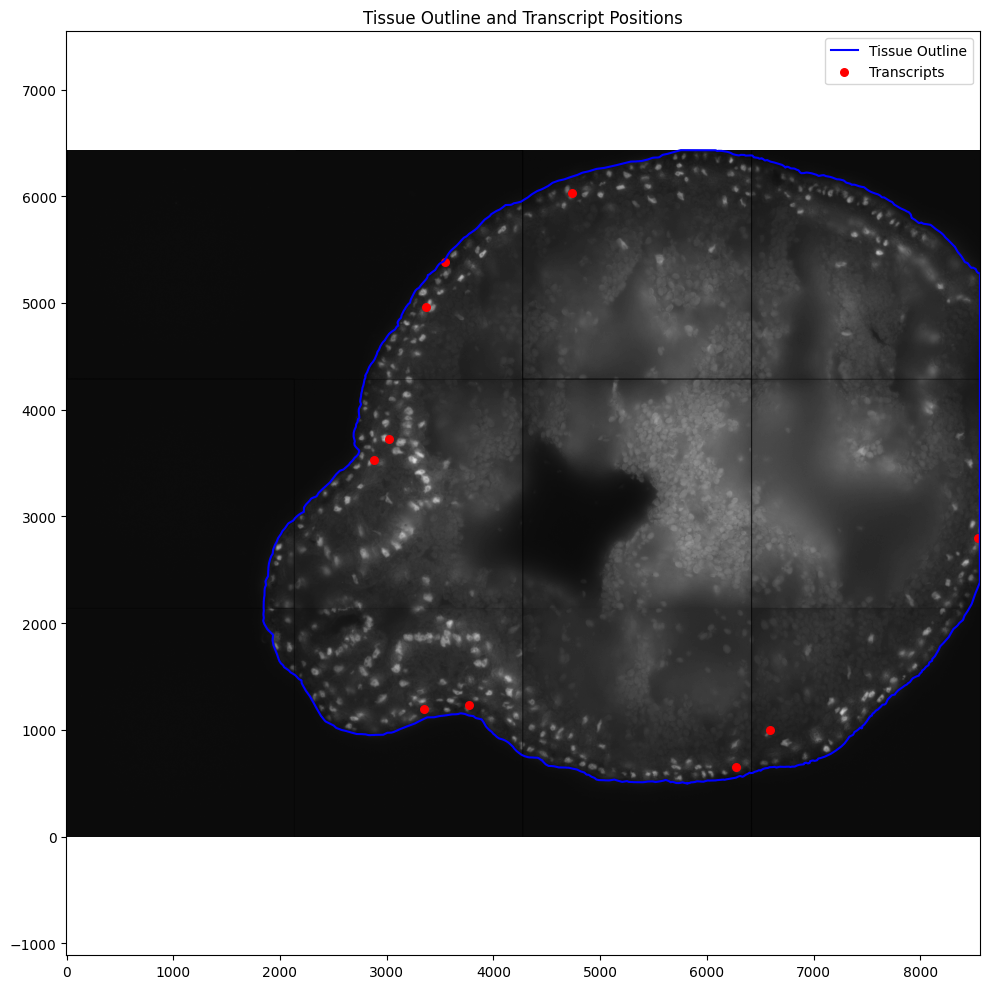

In [18]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img, cmap='gray')

# --- Plot outline ---
ax.plot(outline[:, 0], outline[:, 1], '-b', linewidth=1.5, label='Tissue Outline')

# --- Plot transcripts ---
ax.scatter(coords[:, 0], coords[:, 1], c='red', s=30, label='Transcripts')

# --- Formatting ---
ax.set_title("Tissue Outline and Transcript Positions")
ax.invert_yaxis()  # Important for correct orientation
ax.axis('equal')
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

In [12]:
print("Outline max:", outline[:, 0].max(), outline[:, 1].max())
print("Image size:", img.shape)

Outline max: 8559.0 6433.0
Image size: (6434, 8560)


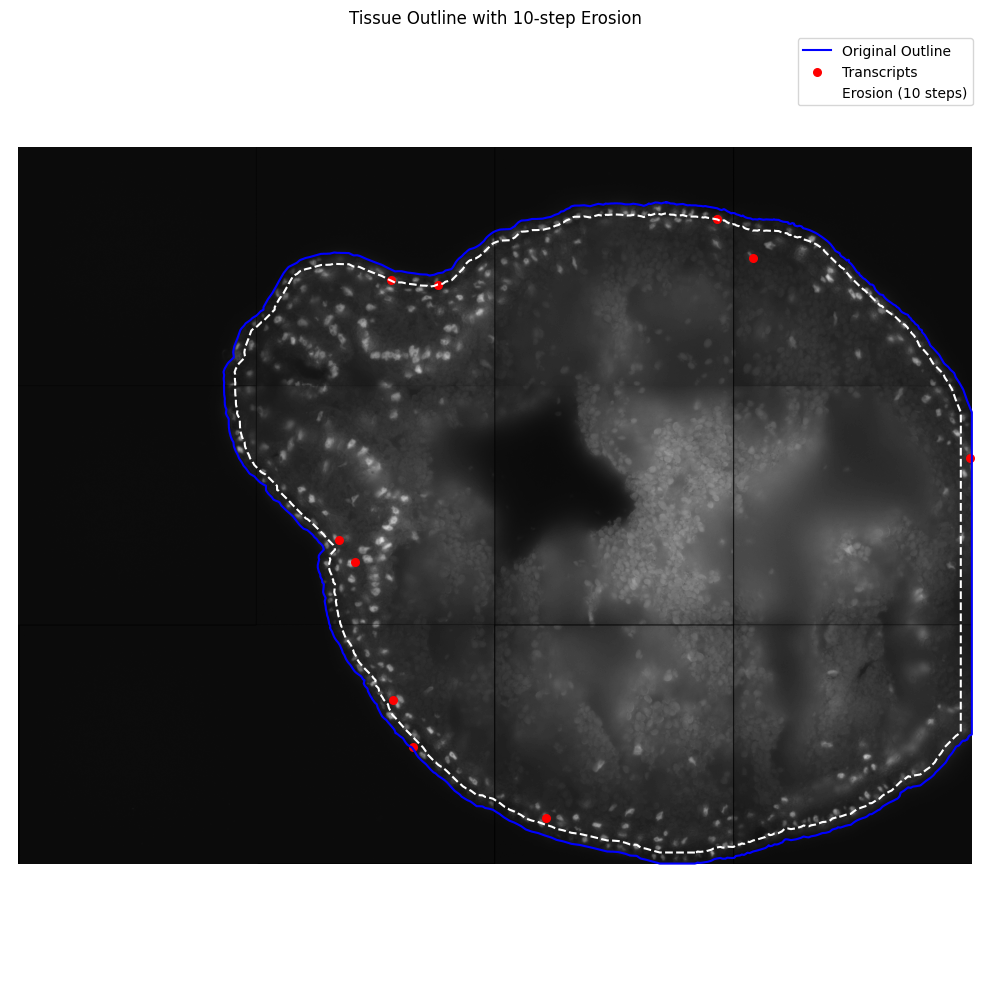

In [ ]:
from skimage.draw import polygon2mask
from skimage.measure import find_contours
from scipy.ndimage import binary_erosion

# --- Create tissue mask from outline (use image shape) ---
mask = polygon2mask((img_h, img_w), outline_yx).astype(bool)

# --- Perform 10 erosions in one step (optimized) ---
eroded_mask = binary_erosion(mask, iterations=10)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img, cmap='gray')

# --- Original outline ---
ax.plot(outline[:, 0], outline[:, 1], '-b', linewidth=1.5, label='Original Outline')

# --- Transcripts ---
ax.scatter(coords[:, 0], coords[:, 1], c='red', s=30, label='Transcripts')

# --- Erosion contours ---
contours = find_contours(eroded_mask.astype(float), 0.5)
for i, contour in enumerate(contours):
    label = 'Erosion (10 steps)' if i == 0 else None
    ax.plot(contour[:, 1] + 0.5, contour[:, 0] + 0.5, '--', color='white', linewidth=1.5, label=label)

# --- Formatting ---
ax.set_title("Tissue Outline with 10-step Erosion")
ax.axis('equal')
ax.axis('off')
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()


## Baysor

In [3]:
import pandas as pd

# Set path to your TXT file
input_path = f"{dir}/21/W6A3_scored_Results.txt"
output_path = f"{dir}/21/transcript.csv"

# Load and format
df = pd.read_csv(input_path, sep="\t", header=None)
df.columns = ['x', 'y', 'z', 'gene', 'score']

# Keep only the needed columns for Baysor: gene, x, y
df_baysor = df[['gene', 'x', 'y']]

# Save to CSV (no index)
df_baysor.to_csv(output_path, index=False)
print(f"✅ Saved transcript CSV for Baysor: {output_path}")


✅ Saved transcript CSV for Baysor: D:/Ziwei/Github/STdata/Resolve files/21/transcript.csv


In [ ]:
import os

def plot_baysor_segmentation_with_markers(dir):
    # Paths
    transcript_path = os.path.join(dir, "transcript.csv")
    polygon_path = os.path.join(dir, "baysor_output", "segmentation_polygons_2d.json")

    # --- Automatically find the DAPI image ---
    dapi_file = None
    for f in os.listdir(dir):
        if f.lower().endswith(('.tiff', '.tif')) and 'dapi' in f.lower():
            dapi_file = os.path.join(dir, f)
            break
    if dapi_file is None:
        raise FileNotFoundError("DAPI image not found in the directory.")

    # Load data
    transcripts = pd.read_csv(transcript_path)
    img = imread(dapi_file)
    img_h, img_w = img.shape

    with open(polygon_path) as f:
        geojson = json.load(f)

    # Define marker genes
    basal_genes = {'tp63.L', 'tp63.S', 'pfn1.L'}
    goblet_genes = {'itln1.L'}
    ssc_genes = {'ano1.L', 'kcha4.S'}

    # Assign cell types
    def classify_gene(gene):
        if gene in basal_genes:
            return 'Basal'
        elif gene in goblet_genes:
            return 'Goblet'
        elif gene in ssc_genes:
            return 'SSC'
        else:
            return None

    transcripts['cell_type'] = transcripts['gene'].apply(classify_gene)
    highlighted = transcripts[transcripts['cell_type'].notnull()]

    # Plotting
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.imshow(img, cmap='gray')

    # Add segmentation polygons
    patches = []
    for feature in geojson['features']:
        coords = feature['geometry']['coordinates'][0]
        patches.append(Polygon(coords, closed=True))

    p = PatchCollection(patches, facecolor='none', edgecolor='cyan', linewidths=1)
    ax.add_collection(p)

    # Add highlighted transcripts
    colors = {'Basal': 'orange', 'Goblet': 'red', 'SSC': 'magenta'}
    for cell_type, color in colors.items():
        subset = highlighted[highlighted['cell_type'] == cell_type]
        ax.scatter(subset['x'], subset['y'], c=color, label=cell_type, s=0.5, alpha=0.5)

    # Format plot
    ax.set_xlim(0, img.shape[1])
    ax.set_ylim(0, img.shape[0])
    ax.set_aspect('equal')
    ax.set_title("Marker Transcripts Overlayed with Baysor Segmentation")
    ax.legend()
    ax.invert_yaxis()
    plt.tight_layout()
    plt.show()


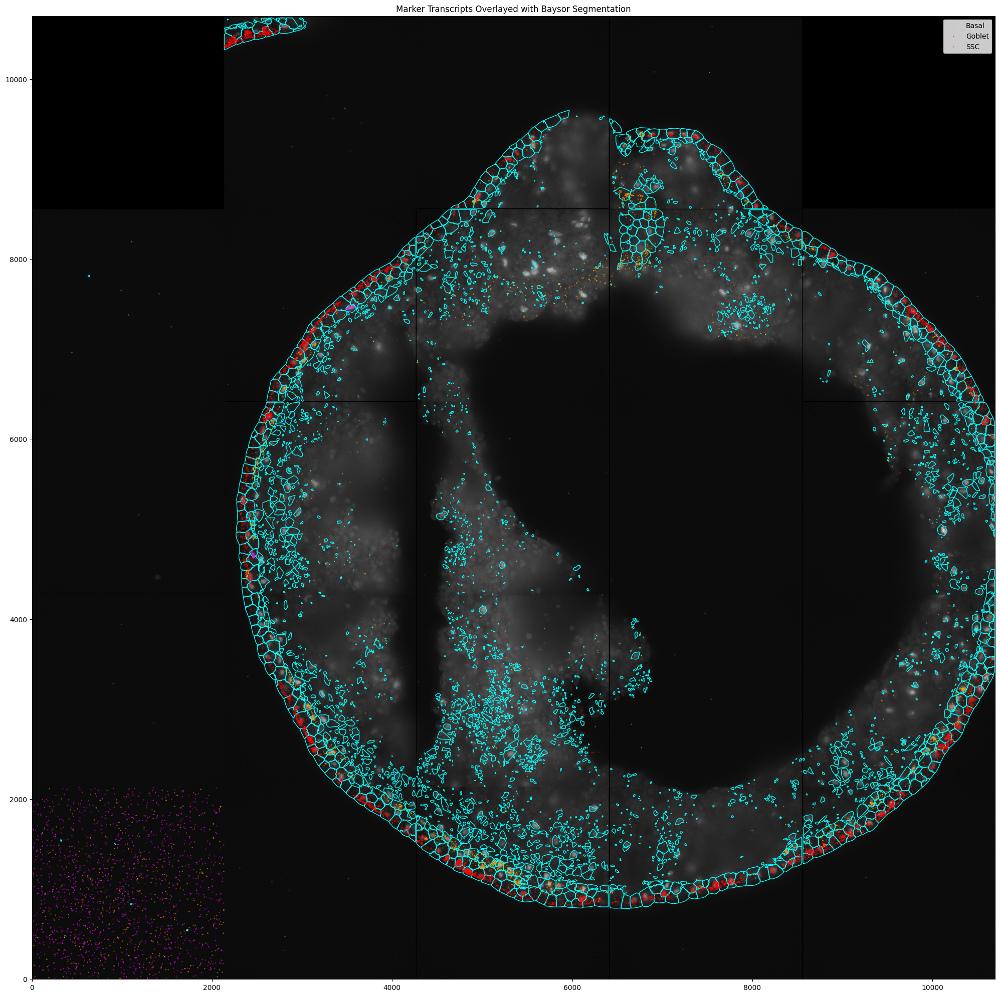

In [7]:
dir = "D:/Ziwei/Github/STdata/Resolve files/21"
plot_baysor_segmentation_with_markers(dir)

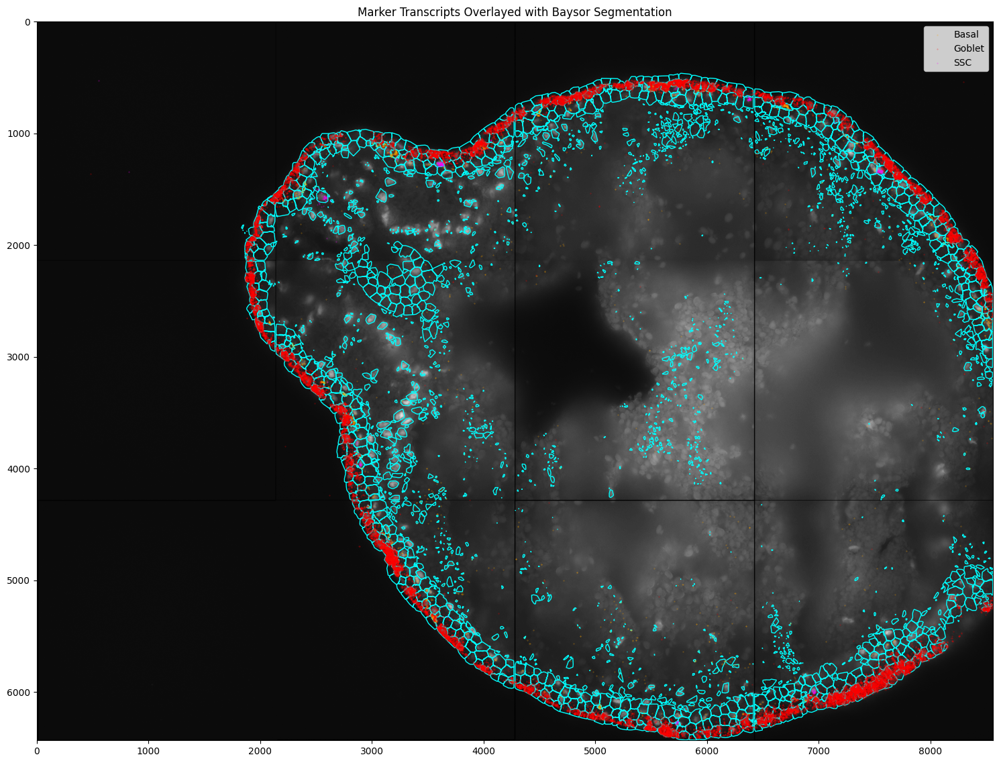

In [4]:


# --- Paths ---
dir = "D:/Ziwei/Github/STdata/Resolve files/22"
image_path = f"{dir}/W1A4_DAPI.tiff"
polygon_path = f"{dir}/baysor_output_polygons_2d.json"
transcripts = pd.read_csv(f"{dir}/transcript.csv")

# --- Load image ---
img = imread(image_path)
img_h, img_w = img.shape

# --- Load GeoJSON polygons ---
with open(polygon_path) as f:
    geojson = json.load(f)

basal_genes = {'tp63.L', 'tp63.S', 'pfn1.L'}
goblet_genes = {'itln1.L'}
ssc_genes = {'ano1.L', 'kcha4.S'}

# --- Assign cell type for coloring ---
def classify_gene(gene):
    if gene in basal_genes:
        return 'Basal'
    elif gene in goblet_genes:
        return 'Goblet'
    elif gene in ssc_genes:
        return 'SSC'
    else:
        return None

transcripts['cell_type'] = transcripts['gene'].apply(classify_gene)
highlighted = transcripts[transcripts['cell_type'].notnull()]

# --- Plot ---
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(img, cmap='gray')

# --- Add segmentation polygons ---
patches = []
for feature in geojson['features']:
    coords = feature['geometry']['coordinates'][0]
    patches.append(Polygon(coords, closed=True))

p = PatchCollection(patches, facecolor='none', edgecolor='cyan', linewidths=1)
ax.add_collection(p)

# --- Add highlighted transcripts ---
colors = {'Basal': 'orange', 'Goblet': 'red', 'SSC': 'magenta'}
for cell_type, color in colors.items():
    subset = highlighted[highlighted['cell_type'] == cell_type]
    ax.scatter(subset['x'], subset['y'], c=color, label=cell_type, s=0.1, alpha=0.5)

# --- Format plot ---
ax.set_xlim(0, img.shape[1])
ax.set_ylim(0, img.shape[0])
ax.invert_yaxis()
ax.set_aspect('equal')
ax.set_title("Marker Transcripts Overlayed with Baysor Segmentation")
ax.legend()
plt.tight_layout()
plt.show()



In [15]:
img = imread('D:/Ziwei/Github/STdata/Resolve files/21/W6A3_DAPI.tiff')
transcripts = pd.read_csv('D:/Ziwei/Github/STdata/Resolve files/21/transcript.csv')
polygon_path = f"D:/Ziwei/Github/STdata/Resolve files/21/baysor_output/segmentation_polygons_2d.json"

C:\Users\ljd567\AppData\Local\Temp\ipykernel_42568\1743810933.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  highlighted_crop['x_rel'] = highlighted_crop['x'] - x_min
C:\Users\ljd567\AppData\Local\Temp\ipykernel_42568\1743810933.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  highlighted_crop['y_rel'] = highlighted_crop['y'] - y_min
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


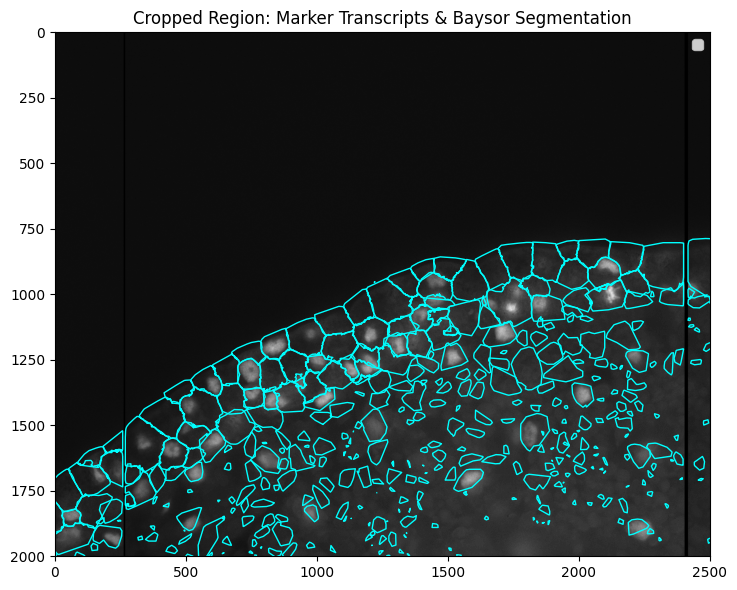

In [16]:
x_min, x_max = 4000, 6500
y_min, y_max = 0, 2000
img_crop = img[y_min:y_max, x_min:x_max]

# --- Load polygons ---
with open(polygon_path) as f:
    geojson = json.load(f)

# --- Define marker genes ---
basal_genes = {'tp63.L', 'tp63.S', 'pfn1.L'}
goblet_genes = {'itln1.L'}
ssc_genes = {'ano1.L', 'kcha4.S'}

def classify_gene(gene):
    if gene in basal_genes:
        return 'Basal'
    elif gene in goblet_genes:
        return 'Goblet'
    elif gene in ssc_genes:
        return 'SSC'
    else:
        return None

transcripts['cell_type'] = transcripts['gene'].apply(classify_gene)
highlighted = transcripts[transcripts['cell_type'].notnull()]

# --- Crop transcript points ---
highlighted_crop = highlighted[
    (highlighted['x'] >= x_min) & (highlighted['x'] <= x_max) &
    (highlighted['y'] >= y_min) & (highlighted['y'] <= y_max)
]
highlighted_crop['x_rel'] = highlighted_crop['x'] - x_min
highlighted_crop['y_rel'] = highlighted_crop['y'] - y_min

# --- Crop polygons ---
patches = []
for feature in geojson['features']:
    coords = feature['geometry']['coordinates'][0]
    if coords is None or len(coords) < 3:
        continue
    coords = np.array(coords)
    if (coords[:, 0].max() >= x_min and coords[:, 0].min() <= x_max and
        coords[:, 1].max() >= y_min and coords[:, 1].min() <= y_max):
        coords_crop = coords - [x_min, y_min]
        patches.append(Polygon(coords_crop, closed=True))

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(img_crop, cmap='gray', extent=[0, x_max - x_min, y_max - y_min, 0])

p = PatchCollection(patches, facecolor='none', edgecolor='cyan', linewidths=1)
ax.add_collection(p)


ax.set_xlim(0, x_max - x_min)
ax.set_ylim(y_max - y_min, 0)
ax.set_aspect('equal')
ax.set_title("Cropped Region: Marker Transcripts & Baysor Segmentation")
ax.legend()
plt.tight_layout()
plt.show()

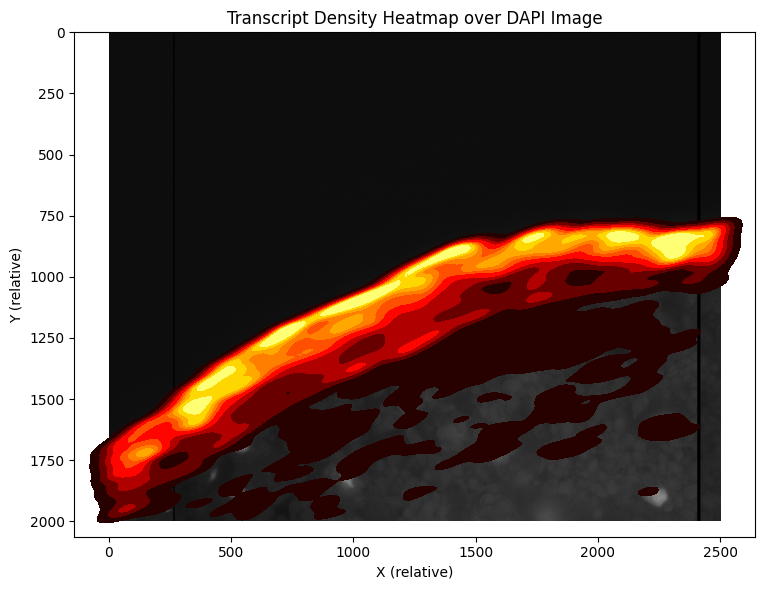

In [17]:
import seaborn as sns

x_min, x_max = 4000, 6500
y_min, y_max = 0, 2000

# Crop image
img_crop = img[y_min:y_max, x_min:x_max]

# Crop transcripts
roi = transcripts[(transcripts['x'] >= x_min) & (transcripts['x'] <= x_max) &
                  (transcripts['y'] >= y_min) & (transcripts['y'] <= y_max)]
x_vals = roi['x'] - x_min
y_vals = roi['y'] - y_min

# --- Plot image and KDE ---
plt.figure(figsize=(10, 6))
plt.imshow(img_crop, cmap='gray', extent=[0, x_max - x_min, y_max - y_min, 0])
sns.kdeplot(x=x_vals, y=y_vals, fill=True, cmap='hot', bw_adjust=0.5, thresh=0.05)
plt.title("Transcript Density Heatmap over DAPI Image")
plt.xlabel("X (relative)")
plt.ylabel("Y (relative)")
plt.tight_layout()
plt.show()

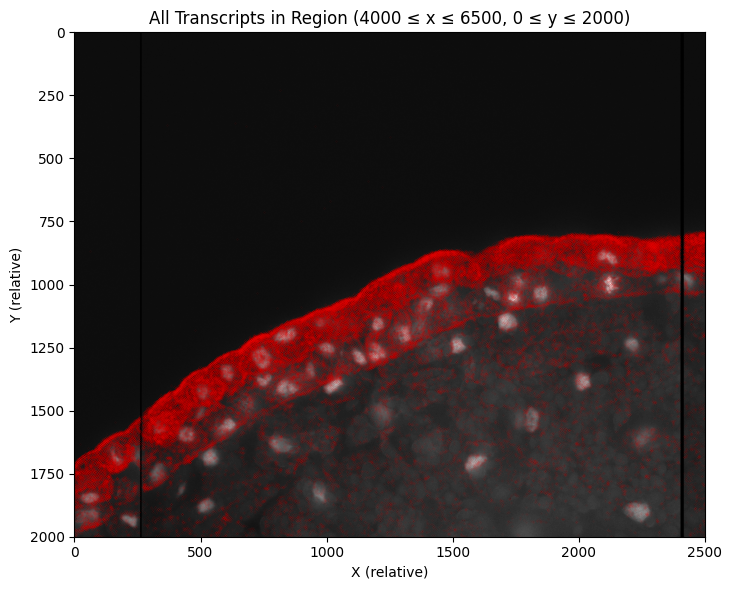

In [19]:
plt.figure(figsize=(10, 6))
plt.imshow(img_crop, cmap='gray', extent=[0, x_max - x_min, y_max - y_min, 0])
plt.scatter(x_vals, y_vals, c='red', s=0.01, alpha=0.3)
plt.title("All Transcripts in Region (4000 ≤ x ≤ 6500, 0 ≤ y ≤ 2000)")
plt.xlabel("X (relative)")
plt.ylabel("Y (relative)")
plt.tight_layout()
plt.show()

In [ ]:
import json
from skimage.draw import polygon as skpolygon
from qtpy.QtWidgets import QApplication

# --- Paths ---
dir = "D:/Ziwei/Github/STdata/Resolve files/22"
image_path = f"{dir}/W1A4_DAPI.tiff"
polygon_path = f"{dir}/baysor_output_polygons_2d.json"
transcript_path = f"{dir}/transcript.csv"

# --- Load image and transcripts ---
img = imread(image_path)
H, W = img.shape
transcripts = pd.read_csv(transcript_path)

# --- Load GeoJSON polygons and create label mask ---
with open(polygon_path) as f:
    geojson = json.load(f)

label_mask = np.zeros((H, W), dtype=np.int32)
label_id = 1

for feature in geojson['features']:
    coords = feature['geometry']['coordinates'][0]
    if coords is None or len(coords) < 3:
        continue
    coords = np.array(coords)
    rr, cc = skpolygon(coords[:, 1], coords[:, 0], shape=label_mask.shape)  # (y, x)
    label_mask[rr, cc] = label_id
    label_id += 1

# --- Define marker genes ---
basal_genes = {'tp63.L', 'tp63.S', 'pfn1.L'}
goblet_genes = {'itln1.L'}
ssc_genes = {'ano1.L', 'kcha4.S'}

def classify_gene(gene):
    if gene in basal_genes:
        return 'Basal'
    elif gene in goblet_genes:
        return 'Goblet'
    elif gene in ssc_genes:
        return 'SSC'
    else:
        return None

transcripts['cell_type'] = transcripts['gene'].apply(classify_gene)

# --- Prepare transcript points ---
markers_data = []
markers_properties = {"cell_type": []}
cell_type_colors = {'Basal': 'orange', 'Goblet': 'red', 'SSC': 'magenta'}

for _, row in transcripts.iterrows():
    if pd.isna(row['cell_type']):
        continue
    markers_data.append([row['y'], row['x']])  # (row, col)
    markers_properties["cell_type"].append(row['cell_type'])

# --- Launch Napari ---
app = QApplication.instance() or QApplication([])

viewer = napari.Viewer()
viewer.add_image(img, name="DAPI", colormap='gray', contrast_limits=(img.min(), img.max()))
viewer.add_labels(label_mask, name="Cell Mask")
viewer.add_points(np.array(markers_data), properties=markers_properties,
                  name="Transcripts", face_color="cell_type",
                  face_color_cycle=cell_type_colors, size=5)

napari.run()


In [ ]:
import json
from skimage.draw import polygon as skpolygon
from qtpy.QtWidgets import QApplication

# --- Paths ---
dir = "D:/Ziwei/Github/STdata/Resolve files/22"
image_path = f"{dir}/W1A4_DAPI.tiff"
polygon_path = f"{dir}/baysor_output_polygons_2d.json"
transcript_path = f"{dir}/transcript.csv"

# --- Load image and transcripts ---
img = imread(image_path)
H, W = img.shape
transcripts = pd.read_csv(transcript_path)

# --- Load GeoJSON polygons and create label mask ---
with open(polygon_path) as f:
    geojson = json.load(f)

label_mask = np.zeros((H, W), dtype=np.int32)
label_id = 1

for feature in geojson['features']:
    coords = feature['geometry']['coordinates'][0]
    if coords is None or len(coords) < 3:
        continue
    coords = np.array(coords)
    rr, cc = skpolygon(coords[:, 1], coords[:, 0], shape=label_mask.shape)  # (y, x)
    label_mask[rr, cc] = label_id
    label_id += 1

# --- Define marker genes ---
basal_genes = {'tp63.L', 'tp63.S', 'pfn1.L'}
goblet_genes = {'itln1.L'}
ssc_genes = {'ano1.L', 'kcha4.S'}

def classify_gene(gene):
    if gene in basal_genes:
        return 'Basal'
    elif gene in goblet_genes:
        return 'Goblet'
    elif gene in ssc_genes:
        return 'SSC'
    else:
        return None

transcripts['cell_type'] = transcripts['gene'].apply(classify_gene)

# --- Prepare transcript points ---
highlighted = transcripts[transcripts['cell_type'].notna()]
unclassified = transcripts[transcripts['cell_type'].isna()]

highlighted_points = np.array(highlighted[['y', 'x']])
highlighted_props = {"cell_type": highlighted['cell_type'].values.tolist()}
cell_type_colors = {'Basal': 'orange', 'Goblet': 'red', 'SSC': 'magenta'}

unclassified_points = np.array(unclassified[['y', 'x']])

# --- Launch Napari ---
app = QApplication.instance() or QApplication([])

viewer = napari.Viewer()
viewer.add_image(img, name="DAPI", colormap='gray', contrast_limits=(img.min(), img.max()))
viewer.add_labels(label_mask, name="Cell Mask")

viewer.add_points(highlighted_points, properties=highlighted_props,
                  name="Marker Transcripts", face_color="cell_type",
                  face_color_cycle=cell_type_colors, size=5)

viewer.add_points(unclassified_points, name="Other Transcripts",
                  face_color='white', size=3, opacity=0.4)

napari.run()
